<a href="https://colab.research.google.com/github/plthiyagu/AI-Engineering/blob/master/12-Image%20and%20Video%20Analytics/Object_Tracking_Using_OpenCV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://www.analyticsvidhya.com/blog/2021/08/getting-started-with-object-tracking-using-opencv/?utm_source=feedburner&utm_medium=email&utm_campaign=Feed%3A+AnalyticsVidhya+%28Analytics+Vidhya%29

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
def resize(img):
        return cv2.resize(img,(512,512)) # arg1- input image, arg- output_width, output_height

In [ ]:
!wget https://raw.githubusercontent.com/plthiyagu/Personnel/master/Dataset/Video/ballmotion.m4v

--2021-08-04 15:24:05--  https://raw.githubusercontent.com/plthiyagu/Personnel/master/Dataset/Video/ballmotion.m4v
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14849734 (14M) [application/octet-stream]
Saving to: ‘ballmotion.m4v’

ballmotion.m4v      100%[===================>]  14.16M  37.1MB/s    in 0.4s    

2021-08-04 15:24:07 (37.1 MB/s) - ‘ballmotion.m4v’ saved [14849734/14849734]



In [ ]:
vid_file_path ='ballmotion.m4v'

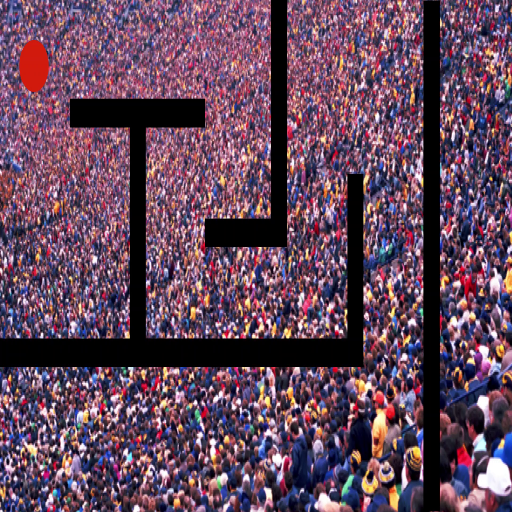

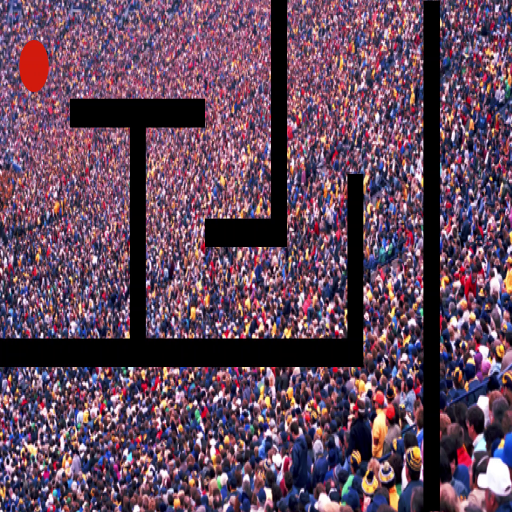

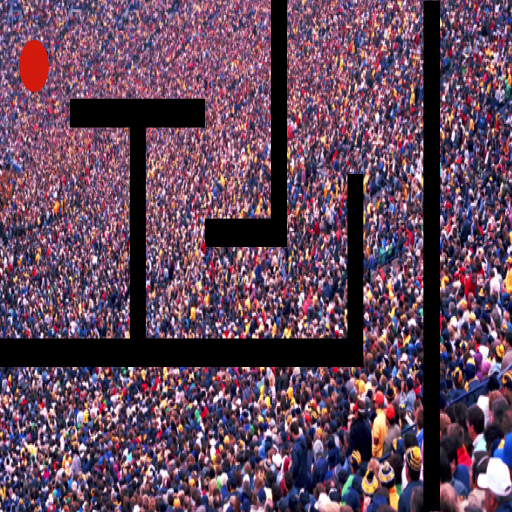

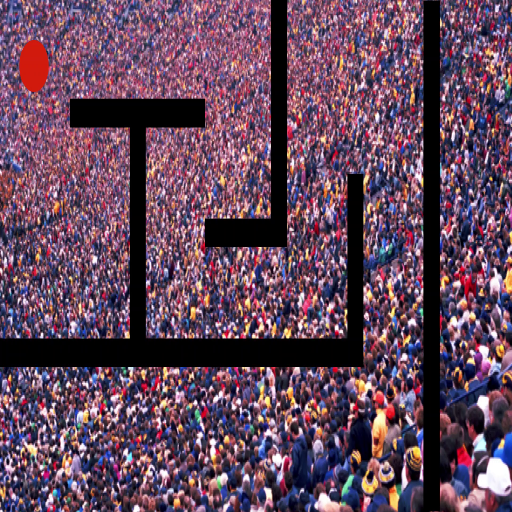

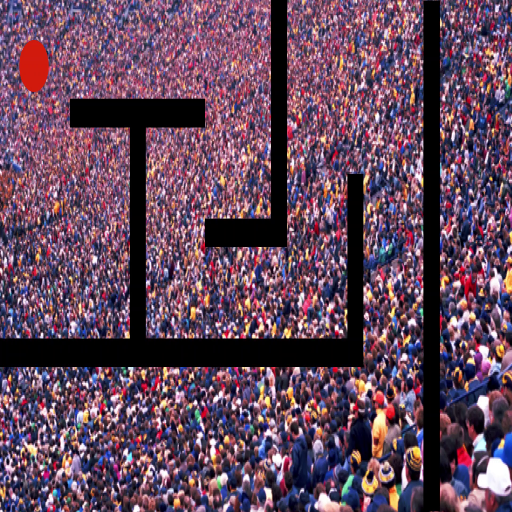

...

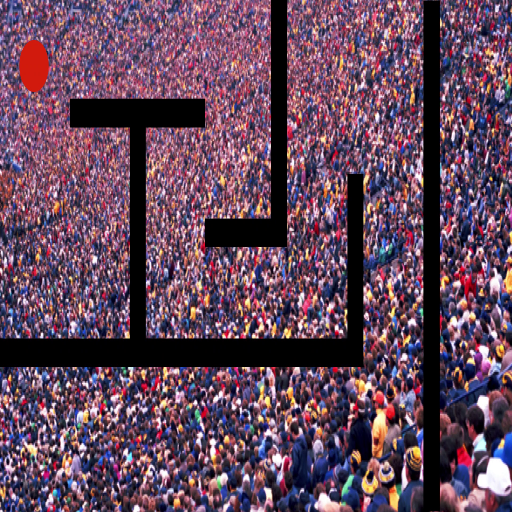

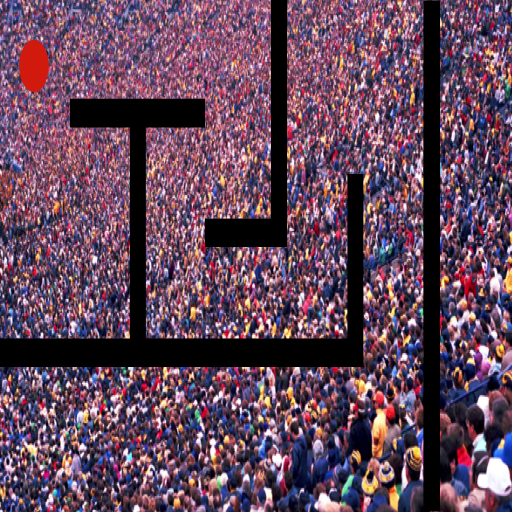

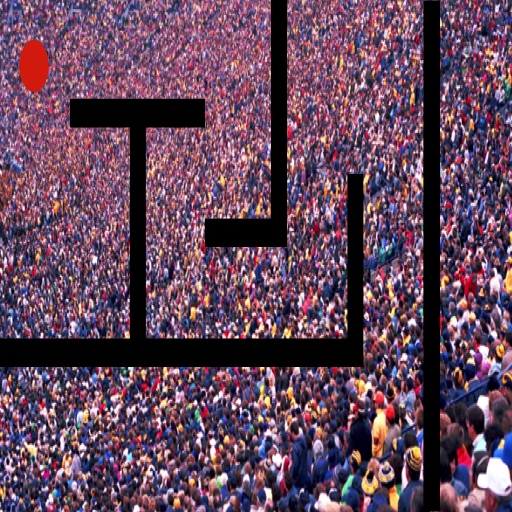

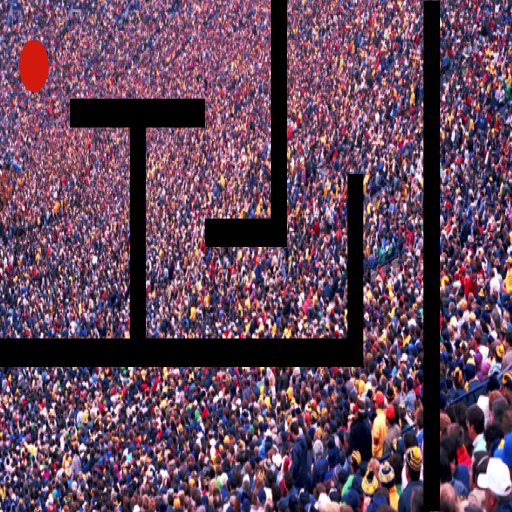

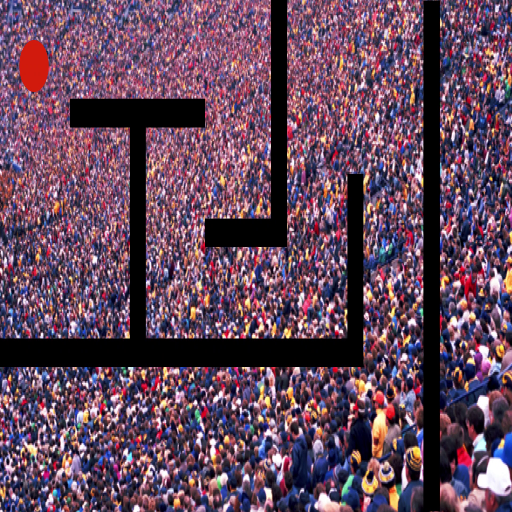

In [ ]:
cap=cv2.VideoCapture(vid_file_path)
ret,frame=cap.read()

while ret==True:
    ret,frame=cap.read()
    cv2_imshow(resize(frame))
    key=cv2.waitKey(1)
    if key==ord('q'):
        break
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
cap=cv2.VideoCapture(vid_file_path)


ret,frame=cap.read()
l_b=np.array([0,230,170])# lower hsv bound for red
u_b=np.array([255,255,220])# upper hsv bound to red

while ret==True:
    ret,frame=cap.read()

    hsv=cv2.cvtColor(frame,cv2.COLOR_BGR2HSV)
    mask=cv2.inRange(hsv,l_b,u_b)

    cv2_imshow(resize(frame))

    cv2_imshow(mask)


    key=cv2.waitKey(1)
    if key==ord('q'):
        break
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
cap=cv2.VideoCapture(vid_file_path)


ret,frame=cap.read()
l_b=np.array([0,230,170])# lower hsv bound for red
u_b=np.array([255,255,220])# upper hsv bound to red

while ret==True:
    ret,frame=cap.read()

    hsv=cv2.cvtColor(frame,cv2.COLOR_BGR2HSV)
    mask=cv2.inRange(hsv,l_b,u_b)

    contours,_= cv2.findContours(mask,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)

    max_contour = contours[0]
    for contour in contours:
      if cv2.contourArea(contour)>cv2.contourArea(max_contour):
        max_contour=contour

    approx=cv2.approxPolyDP(contour, 0.01*cv2.arcLength(contour,True),True)
    x,y,w,h=cv2.boundingRect(approx)
    cv2.rectangle(frame,(x,y),(x+w,y+h),(0,255,0),4)
    cv2_imshow(resize(frame))
    cv2_imshow(mask)

In [ ]:
cap=cv2.VideoCapture(vid_file_path)


ret,frame=cap.read()
l_b=np.array([0,230,170])# lower hsv bound for red
u_b=np.array([255,255,220])# upper hsv bound to red

while ret==True:
    ret,frame=cap.read()

    hsv=cv2.cvtColor(frame,cv2.COLOR_BGR2HSV)
    mask=cv2.inRange(hsv,l_b,u_b)

    contours,_= cv2.findContours(mask,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)

    max_contour = contours[0]
    for contour in contours:
      if cv2.contourArea(contour)>cv2.contourArea(max_contour):
        max_contour = contour

    approx=cv2.approxPolyDP(contour, 0.01*cv2.arcLength(contour,True),True)
    x,y,w,h=cv2.boundingRect(approx)
    cv2.rectangle(frame,(x,y),(x+w,y+h),(0,255,0),4)

    M=cv2.moments(contour)
    cx=int(M['m10']//M['m00'])
    cy=int(M['m01']//M['m00'])
    cv2.circle(frame, (cx,cy),3,(255,0,0),-1)
    cv2_imshow(resize(frame))
    cv2_imshow(mask)
    key=cv2.waitKey(1)
    if key==ord('q'):
      break
    cv2.waitKey(0)
    cv2.destroyAllWindows()